In [ ]:
# !unzip "drive/MyDrive/Dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog-vision/"

# This notebook builds an end to end multiclass image classifier using Tensorflow
## 1. Problem
Identifying the breed of dog given an image of the dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.
## 2. Data
The data we're using is from Kaggle's dog breed identification competition.
## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.
## 4. Features
Some info about the data:
* We're dealing with images(Unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).

# Get our workspace ready.
* Import Tensorflow 2.X
* Import Tensorflow Hub.
* Make sure we are using GPU>

In [2]:
#Import necessary tools.
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)
# Use Keras 2.
version_fn = getattr(tf.keras, "version", None)
if version_fn and version_fn().startswith("3."):
  import tf_keras as keras
else:
  keras = tf.keras

#Check for GPU availability.
print(tf.config.list_logical_devices("GPU"))

2.17.0
0.16.1
[LogicalDevice(name='/device:GPU:0', device_type='GPU')]


# Getting our data ready(turning it into tensors).
With all machine learning models, our data has to be in numerical format.So that's what we'll be doing first.Turning our images into tensors(numerical representation).
Let's start by accessing our data and chechking our labels.

In [3]:
#Checking our labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

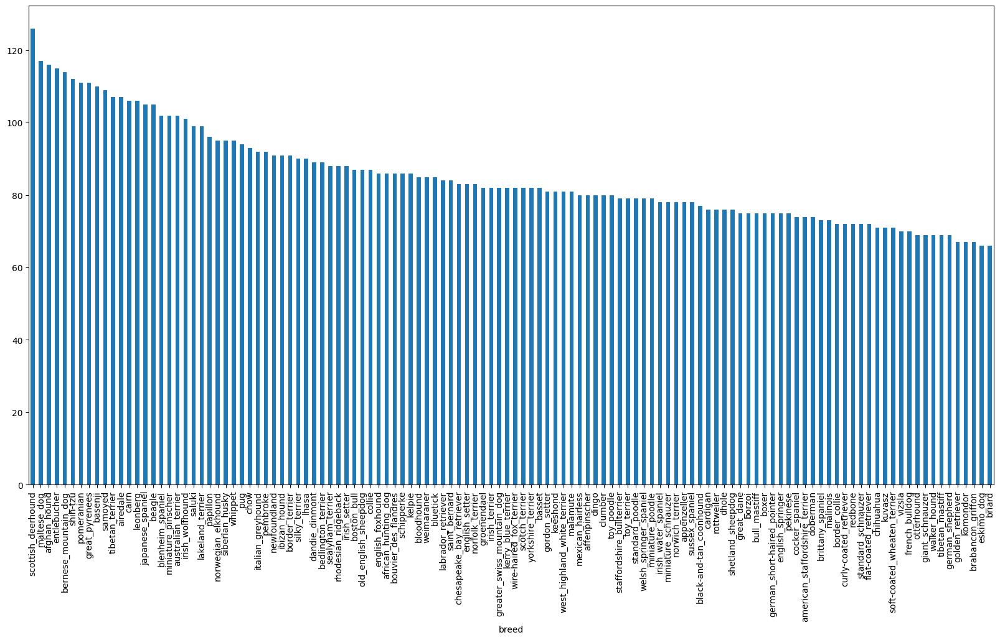

In [4]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

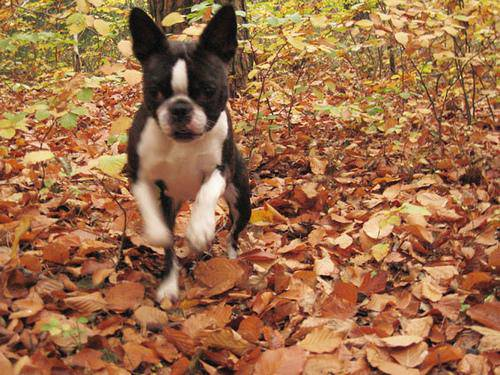

In [6]:
# let's view an image.
from IPython.display import Image
Image("/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting images and their labels.
Let's get a list of all of our image file pathnames.

In [7]:
# Create pathnames from image IDs
filenames = ["/content/drive/MyDrive/Dog-vision/train/"+ fname +".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches with actual number of files.
import os
if len(os.listdir("/content/drive/MyDrive/Dog-vision/train/"))==len(filenames):
  print("Equal")
else:
  print("Not Equal")

Equal


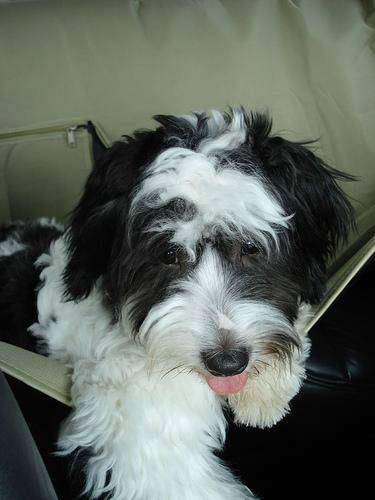

In [8]:
# One final check
Image(filenames[7788])

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [9]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
# See if number of labels matches with number of filenames
if len(labels)==len(filenames):
  print("All good")
else:
  print("Some missing data.")

All good


In [11]:
unique_breeds = np.unique(labels)
print(len(unique_breeds))
unique_breeds


120


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [12]:
# Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
len(boolean_labels)

10222

# Creating our own validation set.
Since dataset from kaggle doesn't come with validation dataset. We have to create our own.

In [13]:
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [14]:
#Set number of images for experimenting.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [15]:
#Let's split our data into training and validation model
from sklearn.model_selection import train_test_split

#Split data into training and validation sets of total NUM_SIZES.
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

# Preprocessing images(turning images into tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable, image
3. Turn our image(a jpg) into Tensors.
4. Normalize our image(convert color channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224,224).
6. Return the modified image.


In [16]:
# Define the image size
IMG_SIZE = 224

#Create a function for preprocesing images.
def process_image(image_path):
  """
  Takes an image file path and turns that image into tensors.
  """
  #Read an image file.
  image = tf.io.read_file(image_path)
  # Turn the jpeg into numerical Tensor with 3 colour channels (Red, Green, Blue).
  image = tf.io.decode_jpeg(image, channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values.
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224).
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

### Turning our data into batches.
Why turn our data into batches?
Let's say you're trying to process 10,000+ images in one go...they all might not fit into the memory.
So that's why we do about 32(batch size) images at a time(we can manually adjust batch size if needed).
In order to use tensorflow effectively, we need our data in the form of tensor tuples which look like this:
`(images,label)`

In [17]:
#Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

Now we'vs got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all our data (`X`& `y`) into batches!

In [18]:
#Define the batch size, 32 is good start
BATCH_SIZE=32
#Create a function to turn our data into batches.
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  #If the data is test data, we probably don't have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  #If the data is valid data, we don't have to shuffle it.
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  #If the data is test data, we have to shuffle it.
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    #shuffle the image.
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)
  return data_batch


In [19]:
#Create training and validation batches.
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches...
Creating valid data batches...


In [20]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [21]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25 images
  for i in range(25):
    #Create a subplot (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    #Display the image
    plt.imshow(images[i])
    #Add the image label as the image title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")



In [22]:
train_images, train_labels = next(train_data.as_numpy_iterator())
(train_images, train_labels)

(array([[[[0.41044295, 0.5045606 , 0.4182861 ],
          [0.41769084, 0.5118085 , 0.42553398],
          [0.42491367, 0.5190313 , 0.4327568 ],
          ...,
          [0.5562326 , 0.63529414, 0.627451  ],
          [0.53533787, 0.60984766, 0.6020045 ],
          [0.52398455, 0.59849435, 0.5906512 ]],
 
         [[0.39993948, 0.49405712, 0.4077826 ],
          [0.4071604 , 0.50127804, 0.41500354],
          [0.4156023 , 0.5097199 , 0.42344543],
          ...,
          [0.55619234, 0.6310172 , 0.6234892 ],
          [0.5327381 , 0.6072479 , 0.59940475],
          [0.522452  , 0.5969618 , 0.58911866]],
 
         [[0.39188552, 0.48600316, 0.39972866],
          [0.39671746, 0.4908351 , 0.4045606 ],
          [0.40547097, 0.4995886 , 0.4133141 ],
          ...,
          [0.5526261 , 0.627451  , 0.619923  ],
          [0.53005075, 0.60456055, 0.5967174 ],
          [0.5190312 , 0.593541  , 0.5856979 ]],
 
         ...,
 
         [[0.31399676, 0.36497715, 0.26301637],
          [0.30524

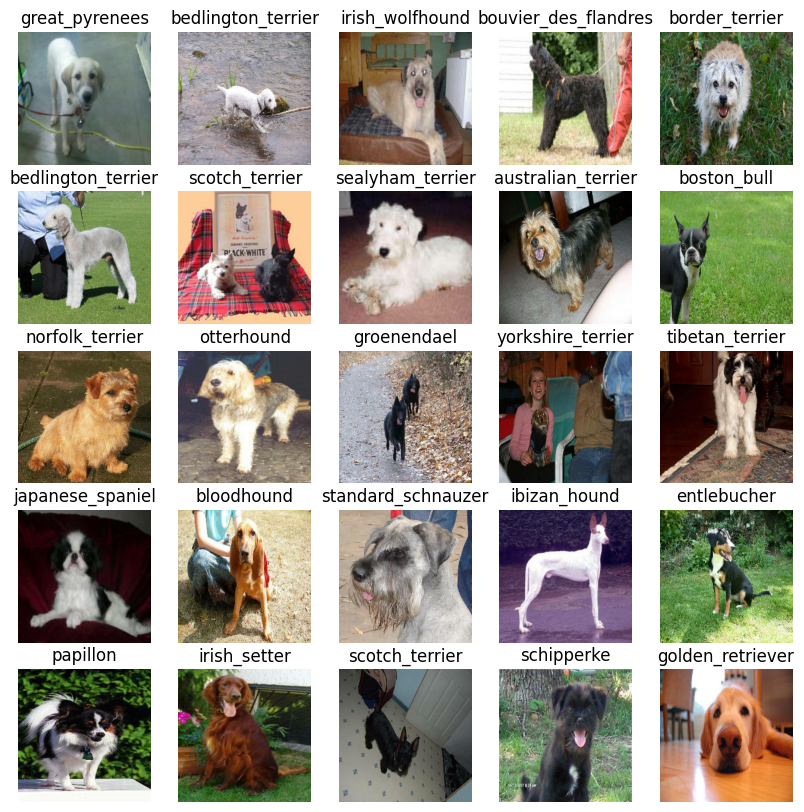

In [23]:
#Let's visualize training data.
show_25_images(train_images,train_labels)

In [24]:
IMG_SIZE

224

### Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of tensors) to our model.
* The output shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use -
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [25]:
#Setup input to shape the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#Setup output shape of our model.
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from tensorflow Hub.
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a keras deep learning model.
Knowing this let's create a function which:
* Takes input shape, output shape and model as parameters.
* Define the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model(says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [26]:
#Create a function which builds a keras model.

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)
  #Setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)
  ])

  #Compile the model.
  model.compile(
      loss = keras.losses.CategoricalCrossentropy(),
      optimizer = keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )
  # Build the model
  model.build(input_shape)
  return model

In [27]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training tòdo such things as save it's progress, check it's progress or stop training early if a model stops improving.
We'll create two callbacks, one for Tensorboard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

### Tensorboard callback

In [29]:
#Load tensorBoard notebook extension
%load_ext tensorboard

In [28]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog-vision/logs", datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [30]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

#Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [31]:
NUM_EPOCHS=100 #@param {type:"slider", min:10, max:100, slider:10}


In [32]:
#check tom make sure GPU is running.
print("Yes" if tf.config.list_logical_devices("GPU") else "NO")

Yes


Let's create a function which trains a model:
* create a model using create_model()
* Setup a TensorBoard callback using `create_tensorboard_callback`.
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUmber of callbacks we'd like to use).
* Return the model.


In [33]:
#Build the model to train and return the model.
def train_model():
  """
  Trains a given and returns the trained version.
  """
  # Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model.
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created.
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #Return the trained model.
  return model

In [34]:
#Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 196s 8s/step - loss: 4.5315 - accuracy: 0.1125 - val_loss: 3.4229 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 144ms/step - loss: 1.6101 - accuracy: 0.7038 - val_loss: 2.1829 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 5s 201ms/step - loss: 0.5592 - accuracy: 0.9362 - val_loss: 1.6803 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 140ms/step - loss: 0.2468 - accuracy: 0.9925 - val_loss: 1.4736 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 161ms/step - loss: 0.1416 - accuracy: 0.9987 - val_loss: 1.4059 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 193ms/step - loss: 0.0973 - accuracy: 1.0000 - val_loss: 1.3632 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

### Checking the Tensor Board logs
The TensorBoard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize it contents.

In [35]:
%tensorboard --logdir /content/drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

In [36]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 27s 129ms/step


array([[6.2214053e-04, 9.0672547e-05, 2.1501076e-03, ..., 3.6327040e-04,
        7.6550832e-06, 2.1827156e-03],
       [1.0310035e-03, 3.1041808e-04, 7.7684015e-02, ..., 5.9293193e-04,
        1.5383664e-03, 4.5994922e-04],
       [5.0638261e-04, 1.8700286e-04, 2.0728327e-04, ..., 1.8482086e-04,
        1.6076576e-04, 5.5016665e-04],
       ...,
       [2.4872257e-05, 1.6790318e-04, 9.0394467e-05, ..., 8.2986706e-05,
        4.6784127e-05, 4.3457982e-05],
       [1.7322102e-03, 8.6806329e-05, 2.0713631e-04, ..., 1.0906399e-04,
        7.4699252e-05, 1.9194385e-02],
       [4.6562529e-04, 8.0507867e-05, 1.2231898e-03, ..., 6.2859068e-03,
        2.1874197e-03, 1.2092516e-04]], dtype=float32)

In [37]:
predictions.shape

(200, 120)

In [38]:
#prediction
index=42
print(predictions[index])
print(f"Max value (probability of predictions):", {np.max(predictions[index])})
print((f"Sum: {np.sum(predictions[index])}"))
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")


[3.13749624e-05 6.39913706e-05 1.70065454e-04 1.17843490e-04
 1.32183579e-03 3.48694011e-05 2.36154825e-04 1.18170027e-03
 7.65205175e-03 7.92921856e-02 8.36028721e-06 5.70518569e-06
 4.21735138e-04 5.92147524e-04 1.38651964e-03 2.01248471e-03
 4.97775400e-05 3.94299976e-04 2.63745402e-04 1.57616232e-04
 2.32400835e-05 3.58301855e-04 4.31857334e-05 9.37858786e-05
 6.54378347e-03 4.38614588e-05 3.70969101e-05 7.77693203e-05
 1.26238941e-04 2.64761111e-05 1.91079835e-05 2.83110276e-04
 8.26369578e-05 3.63439503e-05 4.28676030e-05 9.26623106e-05
 1.74739180e-04 1.09662797e-04 9.56682052e-05 4.03331928e-02
 1.59264266e-04 4.69596453e-05 5.73175866e-03 2.51385391e-05
 1.13724353e-04 7.30764004e-05 3.44011467e-04 5.74639183e-04
 6.41524139e-06 2.92169891e-04 1.20464123e-04 1.66193233e-04
 1.35665861e-04 1.05691561e-03 4.33316700e-06 6.41632127e-04
 1.24135724e-04 2.82909859e-05 3.78544210e-05 2.33652208e-05
 5.32043778e-05 5.25287993e-04 4.34645290e-06 3.92578113e-05
 5.06133292e-05 4.972354

Having the above functionality is great but we want to be able to do it at scale.
And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [39]:
#Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
#Get a predicted label based on an array of prediction probabilities.
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Now that our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [40]:
#Create a function to unbatch a batch dataset.
images_ = []
labels_ = []
#Loop through unbatched data.
for images, labels in val_data.unbatch().as_numpy_iterator():
  images_.append(images)
  labels_.append(labels)

In [41]:
#Create a function unbatch a batch dataset.
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels
  """
  images =[]
  labels = []
  #Loop through the data.
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [42]:
labels_

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

Now we've got ways to get:
*   Prediction Label
*   Validation labels(truth labels)
*   Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.


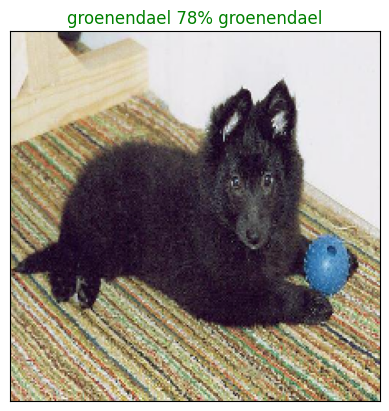

In [42]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image of sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour of title depending on if the prediction is right or wrong.
  if pred_label == true_label:
    colour="green"
  else:
    colour="red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),color=colour)
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our top models top10 predictions.
This function will:
* Take a input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `gret_pred_label`.
* Find the top 10:
  * Prediction probability indexes.
  * Prediction probability values.
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green.


In [43]:
def plot_pred_conf(prediction_probabilities, labels, n=1 ):
  """
  Plus the Top 10 highest prediction confidences along with the truth label with sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  #Get the predicted label
  pred_label = get_pred_label(pred_prob)
  #Find the top 10 prediction confidence indexes.
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values.
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels.
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels, rotation="vertical")
  #Change colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(true_label==top_10_pred_labels)].set_color("green")
  else:
    pass


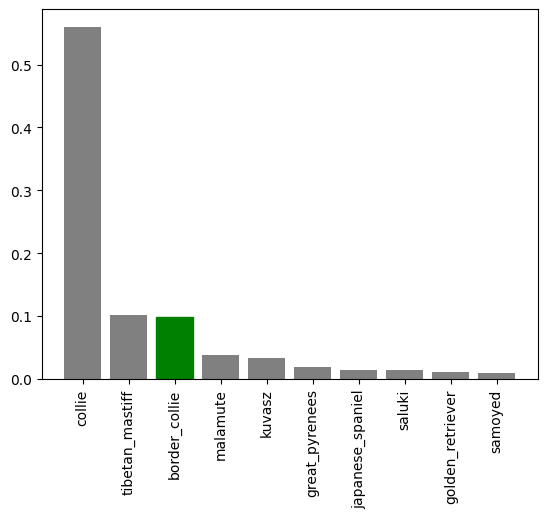

In [44]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.


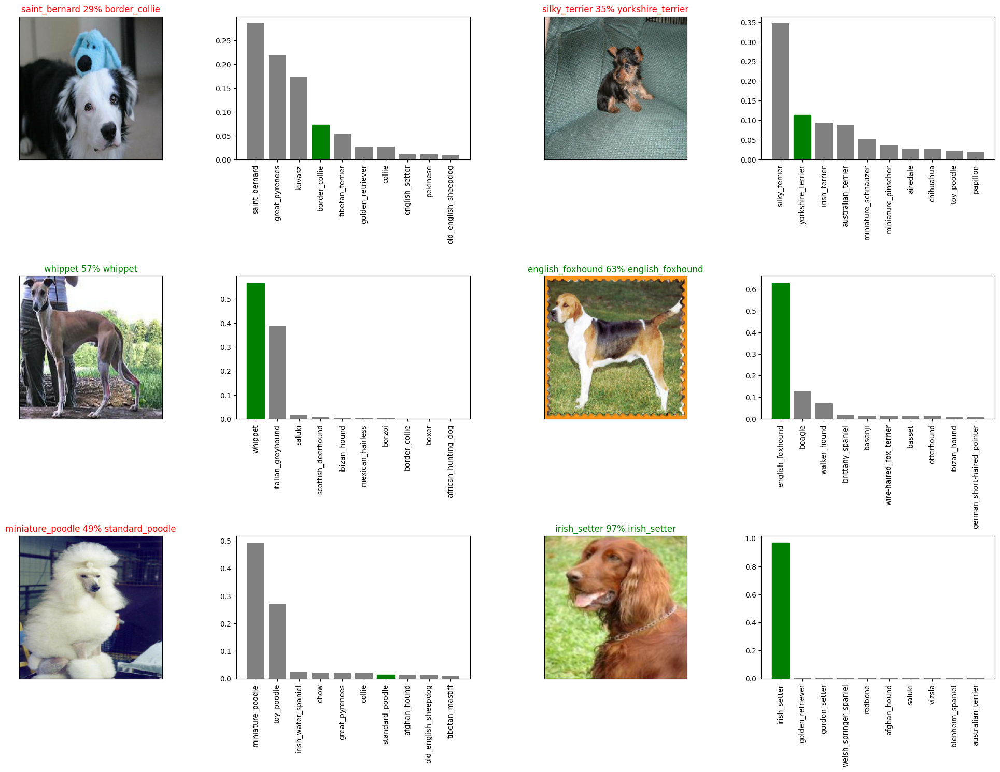

In [45]:
#Let"s check out few predicitions and their different values.
i_multiplier =11
num_rows = 3
num_cols =2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


Save and reload model.

In [46]:
def save_model(model, suffix=None):
  """
  Save a model in a models directory and appends a suffix(string).
  """
  #Create a model directory pathname with current time.
  modeldir = os.path.join("/content/drive/MyDrive/Dog-vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+"-"+ suffix+ ".h5"
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path


In [47]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got function to save and load a trained model, let's make sure they work!

In [61]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/Dog-vision/models/20240904-06131725430414-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-vision/models/20240904-06131725430414-1000-images-mobilenetv2-Adam.h5'

In [67]:
#Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog-vision/models/20240904-06131725430414-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: /content/drive/MyDrive/Dog-vision/models/20240904-06131725430414-1000-images-mobilenetv2-Adam.h5


In [68]:
#Evaluate a pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 17s 2s/step - loss: 1.2423 - accuracy: 0.7050


[1.242287516593933, 0.7049999833106995]

In [69]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2423 - accuracy: 0.7050


[1.242287516593933, 0.7049999833106995]

Training a big dog model (on full data)

In [48]:
#create a data batch with the full data set.
full_data = create_data_batches(X,y)


Creating training data batches...


In [49]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [51]:
#Create full model callbacks.
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [52]:
#Fit the full model to full data.
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1855s 6s/step - loss: 1.2974 - accuracy: 0.6813
Epoch 2/100
320/320 [==============================] - 41s 127ms/step - loss: 0.3993 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 43s 133ms/step - loss: 0.2322 - accuracy: 0.9364
Epoch 4/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1515 - accuracy: 0.9647
Epoch 5/100
320/320 [==============================] - 43s 135ms/step - loss: 0.1050 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0753 - accuracy: 0.9879
Epoch 7/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0572 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0452 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0364 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 40s 126ms

In [53]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/Dog-vision/models/20240904-08071725437268-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-vision/models/20240904-08071725437268-full-image-set-mobilenetv2-Adam.h5'

In [54]:
#load the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog-vision/models/20240904-08071725437268-full-image-set-mobilenetv2-Adam.h5")

Loading a saved model from: /content/drive/MyDrive/Dog-vision/models/20240904-08071725437268-full-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset
Since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same format.
Luckily we created `create_data_batches()` earlier which can take a list of file names as input and convert them  into Tensor batches.
To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`(since the test data diesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [68]:
#Load test image filenames.
test_path = "/content/drive/MyDrive/Dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog-vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 '/content/drive/MyDrive/Dog-vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 '/content/drive/MyDrive/Dog-vision/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e42105cc55af6788d3c15473c562dc77.jpg',
 '/content/drive/MyDrive/Dog-vision/test/deec3d206b0f5c927c86ed1782990961.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e13f3871a8b4a745717ba6903f0dfe05.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e63a126acd70223f2d388702843d185b.jpg',
 '/content/drive/MyDrive/Dog-vision/test/e47de0441a48f2eff7c2faacd350ed06.jpg']

In [69]:
len(test_filenames)

10357

In [70]:
#create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [71]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [72]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 223s 672ms/step


In [73]:
#Save predictions (Numpy array) to csv file (for accessing later)
np.savetxt("/content/drive/MyDrive/Dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [74]:
#Load predictions (Numpy array) from csv file.
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog-vision/preds_array.csv", delimiter=",")

In [75]:
test_predictions[:10]

array([[1.62326170e-08, 5.52086910e-09, 8.48547399e-10, ...,
        2.14716049e-12, 1.85017487e-11, 9.71914909e-04],
       [5.14286704e-11, 1.16789245e-10, 1.24763888e-09, ...,
        5.95349992e-10, 6.06281428e-05, 9.56299449e-12],
       [2.24174528e-06, 3.00930232e-08, 6.98410432e-08, ...,
        6.48728005e-08, 4.01429183e-08, 6.28668886e-07],
       ...,
       [2.18145200e-08, 2.17011848e-08, 2.34279625e-07, ...,
        5.78455740e-07, 4.19390744e-09, 7.18008778e-07],
       [2.29272244e-11, 1.28557538e-08, 3.16132720e-09, ...,
        5.13436238e-10, 1.62908728e-10, 4.37743418e-11],
       [2.29959460e-05, 2.81237590e-05, 6.73517633e-08, ...,
        7.44714896e-07, 6.25523366e-09, 4.51383375e-10]])

In [76]:
test_predictions.shape

(10357, 120)

## Making predictions on custom images.
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.



In [ ]:
#Get custom images filepaths.
